# ライブラリのインストール

In [14]:
import numpy as np
import pandas as pd
import librosa
import librosa.display
import matplotlib.pyplot as plt
import seaborn as sns
import IPython
import IPython.display as ipd
from scipy.io import wavfile
import glob
import os

In [42]:
folder = "./train/audio/"
file_num  = sum(os.path.isfile(os.path.join(folder, name)) \
                     for name in os.listdir(folder))  # ファイル数の取得

files = []
count = 0
for path in sorted(glob.glob(folder+"*.wav")):
    file, _ = librosa.core.load(path, sr=44100)
    files.append(file)
print(len(files))


684


In [43]:
files

[array([ 0.        ,  0.        ,  0.        , ..., -0.00289917,
        -0.00294113, -0.00266647], dtype=float32),
 array([0.        , 0.        , 0.        , ..., 0.00421143, 0.00398254,
        0.00394821], dtype=float32),
 array([ 0.0000000e+00,  0.0000000e+00,  0.0000000e+00, ...,
        -3.6239624e-04, -1.8692017e-04, -1.9073486e-05], dtype=float32),
 array([0.        , 0.        , 0.        , ..., 0.00813293, 0.0098381 ,
        0.00857162], dtype=float32),
 array([ 0.        ,  0.        ,  0.        , ..., -0.00246429,
        -0.00307465, -0.00317764], dtype=float32),
 array([0.        , 0.        , 0.        , ..., 0.00123215, 0.00190735,
        0.00310516], dtype=float32),
 array([0.        , 0.        , 0.        , ..., 0.0087204 , 0.00880051,
        0.0090332 ], dtype=float32),
 array([0.        , 0.        , 0.        , ..., 0.00411606, 0.0051918 ,
        0.0065918 ], dtype=float32),
 array([0.        , 0.        , 0.        , ..., 0.00296021, 0.00320816,
        0.0

## 最初のファイルを再生してみる

In [44]:
sample_000 = files[0]
print(files[0])
# 再生
IPython.display.display(ipd.Audio(data=sample_000, rate=44100))


[ 0.          0.          0.         ... -0.00289917 -0.00294113
 -0.00266647]


In [45]:
reverser = np.full(
                        shape = len(sample_000),
                        fill_value=-1,
                        dtype=np.int)
sample_rev = sample_000[::-1]
IPython.display.display(ipd.Audio(data=sample_rev, rate=44100))

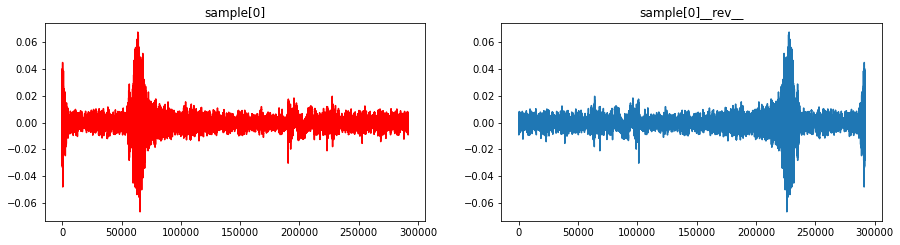

In [46]:
plt.figure(figsize=(15, 8))

# 順再生
plt.subplot2grid((2,2), (0,0), colspan=1)
plt.plot(sample_000, color="red")
plt.title("sample[0]")

# 逆再生
plt.subplot2grid((2,2), (0,1), colspan=1)
plt.plot(sample_rev)
plt.title("sample[0]__rev__")

plt.show()

In [47]:
sample_rates = [60000, 22050, 16000, 10000]
for sr in sample_rates:
    IPython.display.display(ipd.Audio(data=sample_000, rate=sr))

## 上図を拡大する

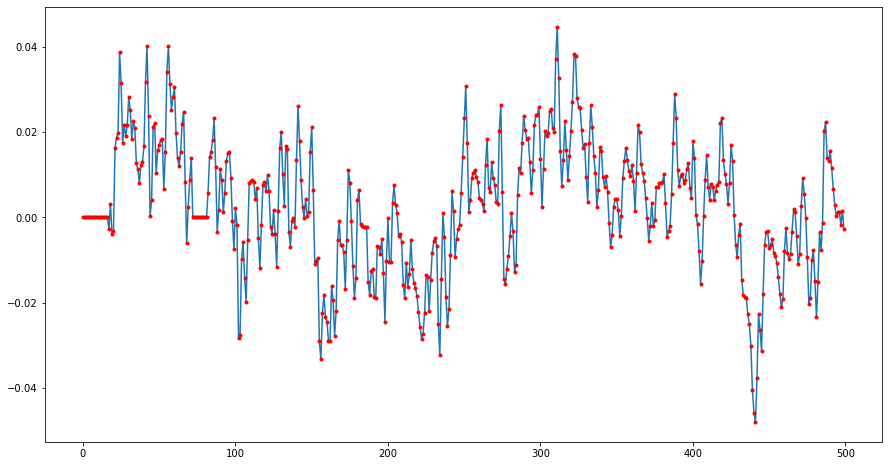

In [48]:
plt.figure(figsize=(15, 8))
plt.plot(sample_000[:500])
plt.plot(sample_000[:500], ".", color='red')
plt.show()

## フーリエ変換により周波数領域への変換

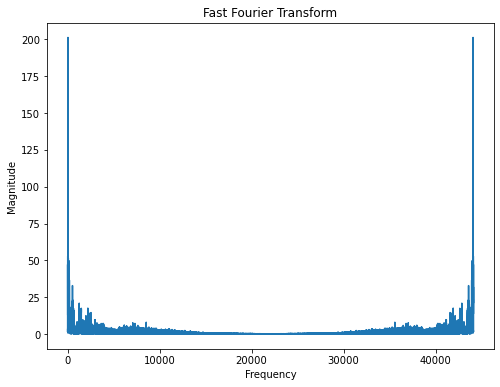

In [49]:
fft = np.fft.fft(sample_000)

magnitude = np.abs(fft)
freq = np.linspace(0, 44100, len(magnitude))

plt.figure(figsize=(8, 6))
plt.plot(freq, magnitude)
plt.title("Fast Fourier Transform")
plt.xlabel("Frequency")
plt.ylabel("Magnitude")
plt.show()

## 左側だけズームして図示

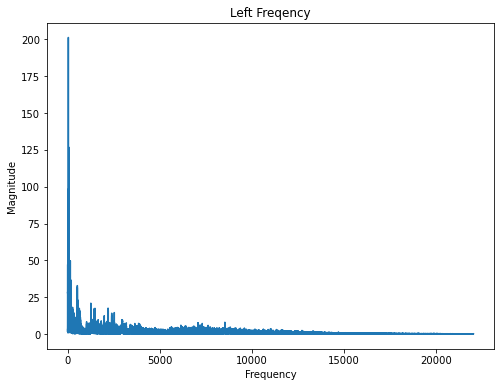

In [50]:
left_freq = freq[:int(len(freq)/2)]
left_magnitude = magnitude[:int(len(magnitude)/2)]

plt.figure(figsize=(8, 6))
plt.plot(left_freq, left_magnitude)
plt.title('Left Freqency')
plt.xlabel("Frequency")
plt.ylabel('Magnitude')
plt.show()

## 最初の9枚の音声の画像の出力

In [51]:
for i in range(9):
    IPython.display.display(ipd.Audio(data=files[i], rate=44100))

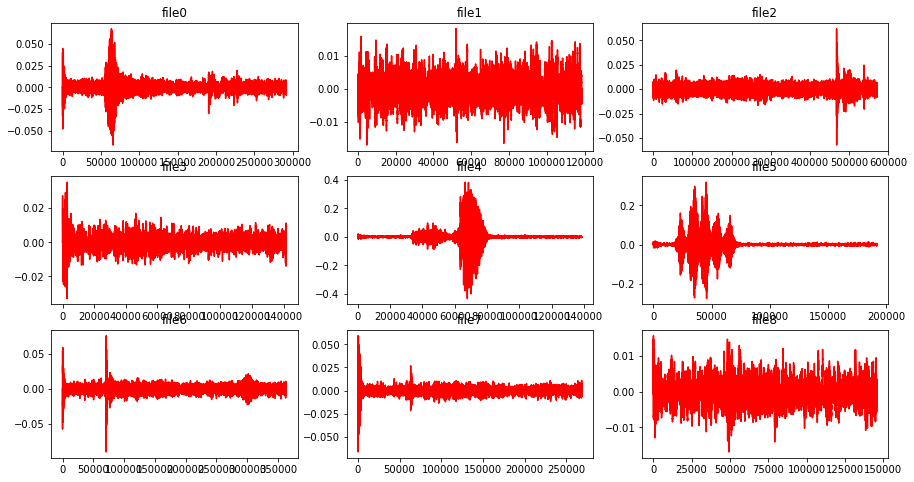

In [52]:
plt.figure(figsize=(15, 8))

for i in range(9):
    # 0, 1, 2　3 -> 0:0, 0:1, 0;2
    plt.subplot2grid((3,3), (i//3, i%3))
    plt.plot(files[i], color='red')
    plt.title(f'file{i}')
plt.show()

1